## 1D PIC (basic version) 

Here we compute the 1D version of PIC. The distribution we use corresponds to a particle current going in both directions with the same mean density and opposite velocities. This configuration generates an instibility and we observe it. 

The Electric field is instantaneous and it is computed solving Poisson equations, that is, it corresponds to a situation where the time scale of the particles is much shorter than the time scale of the bulk density (I guess) 

In [5]:
using DifferentialEquations
using Plots
using Statistics
using FFTW
FFTW.set_provider!("mkl")
#import Pkg; Pkg.add("Distributions")
using Distributions


Helper functions are defined in this file.

In [6]:
include("aux_functions.jl")

get_index_and_distance (generic function with 1 method)

### Parameters

    L;            // Domain of solution 0 <= x <= L (in Debye lengths)
    N;            // Number of electrons
    J;            // Number of grid points
    vb;    // Beam velocity
    dt;    // Time-step (in inverse plasma frequencies)
    t_f;  // Simulation run from t = 0. to t = t_f


In [32]:

L = 100
#N = 200000
N = 20000
#J = 2048
J = 1024
vb = 3
dt = 0.1
t_f = 20.0
t = 0.0
M = convert(Int64,t_f/dt)
#M=1
κ = 2π/L
dx = L/J
x = [dx*(i-1) for i in 1:J] ;
#p = (L, N, J, κ, dx)

1024-element Vector{Float64}:
  0.0
  0.09765625
  0.1953125
  0.29296875
  0.390625
  0.48828125
  0.5859375
  0.68359375
  0.78125
  0.87890625
  ⋮
 99.12109375
 99.21875
 99.31640625
 99.4140625
 99.51171875
 99.609375
 99.70703125
 99.8046875
 99.90234375

### Produce the intial data

The 1D distribution for $\frac{m}{kT} = 1$ is just the normal distribution centered at both $\pm v_p$. With $\sigma = 1$.


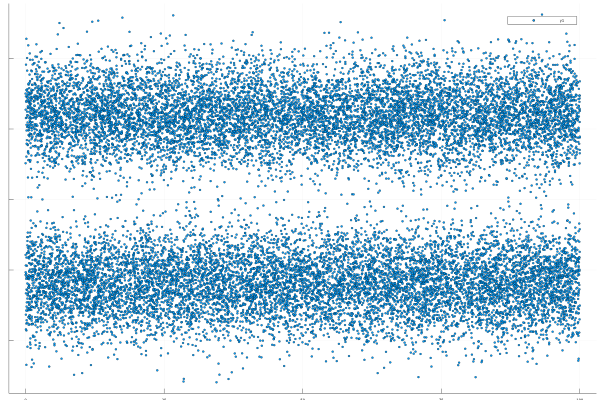

In [33]:

r = L*rand(N)
v = [rand(Normal(-vb,1),N÷2); rand(Normal(vb,1),N÷2)]
u = [r;v];

Coordinate_test(r,L)

plt = scatter(r,v, thickness_scaling = 0.3)
#png("t00_1024_2_4")

Initialize some of the intermediate fields we need.

In [34]:
E = zeros(J)
ϕ = zeros(J)
n = zeros(J)
du = zeros(2*N);


Compute the initial density, potential and electric field.

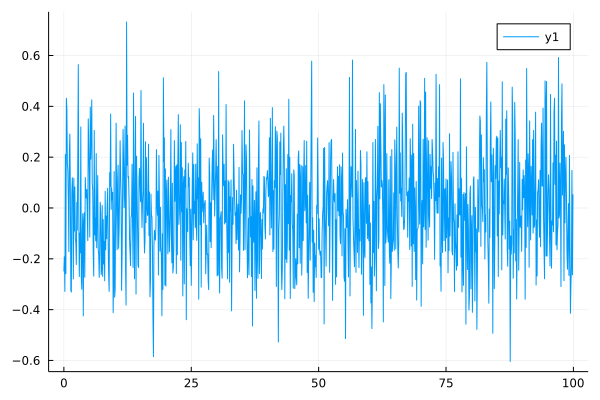

In [35]:
Density!(r,n,dx)
plot(x,n*L/N .- 1)

Find the correspondig potential

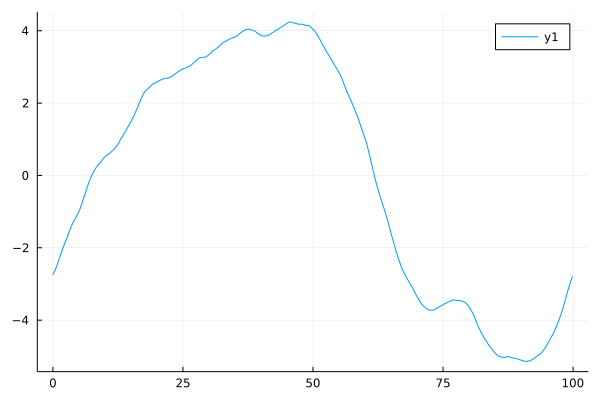

In [36]:
Poisson1D!(ϕ, n*L/N .- 1, κ)
plot(x,ϕ)

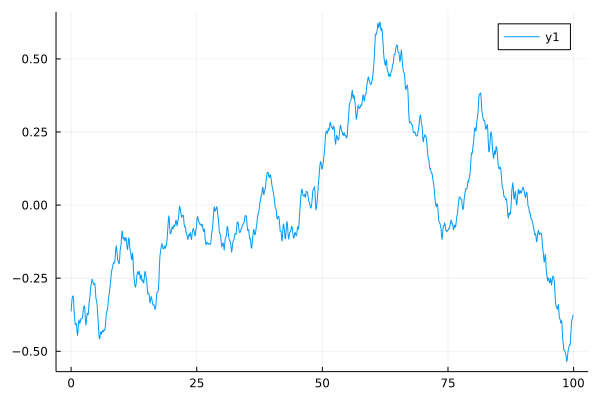

In [37]:
Electric!(ϕ, E, dx)
plot(x,E)

Check the histograms for the initial positions and velocities.

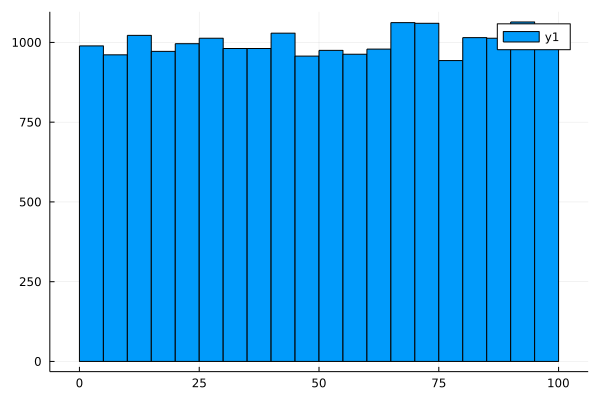

In [38]:
histogram(u[1:N])

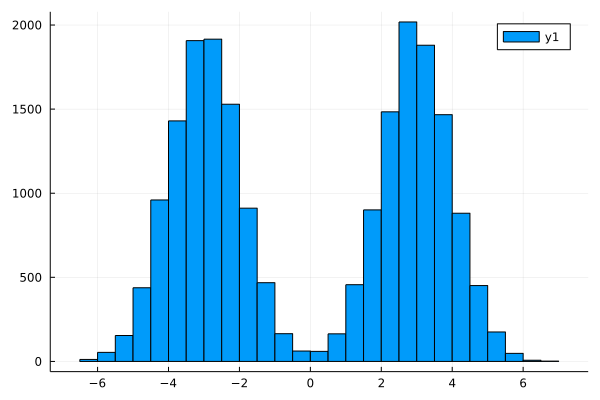

In [39]:
histogram(u[N+1:end])

Now we make the time evolution:

In [40]:
p_RHS = N, J, L, dx, n, E, ϕ, du, Density!, Electric!, Poisson1D! ;

for k in 1:M
  RK4_Step!(RHS,u,t,dt,p_RHS)
  u = [make_periodic!(u[1:N],L); u[N+1:end]]
  if k % (M÷10) == 0
    #scatter(plt, u[1:N], u[N+1:2*N])
  end
  t = t + dt
end

Plot the final values

The density:

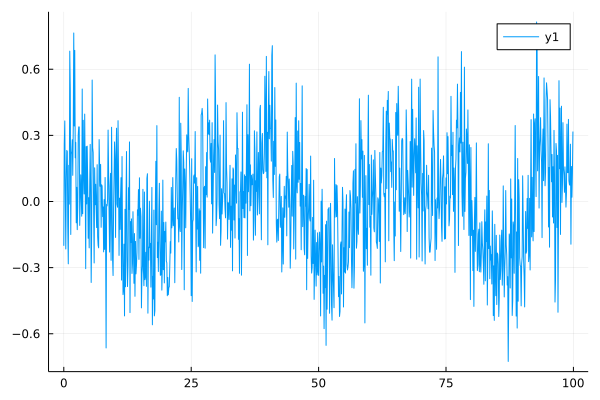

In [41]:
plot(x,n*L/N .- 1)

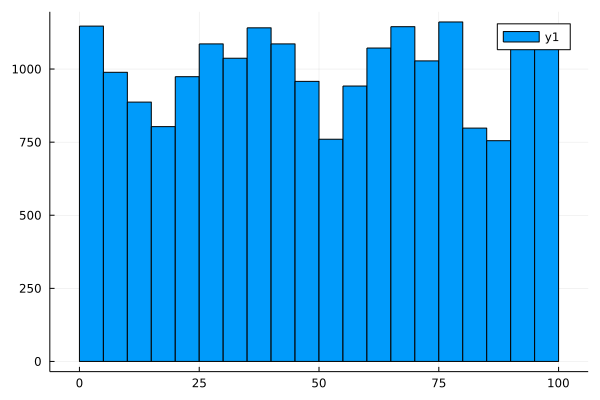

In [42]:
histogram(u[1:N])

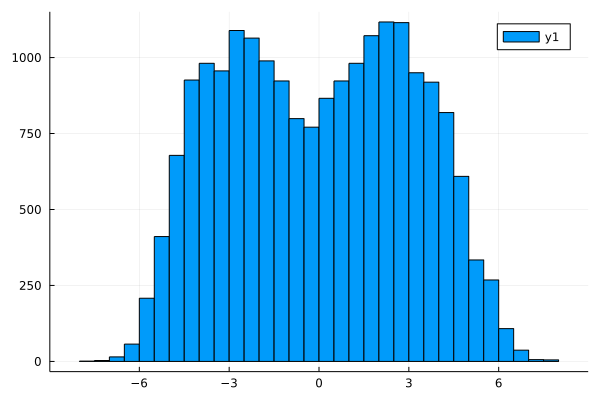

In [43]:
histogram(u[N+1:end])

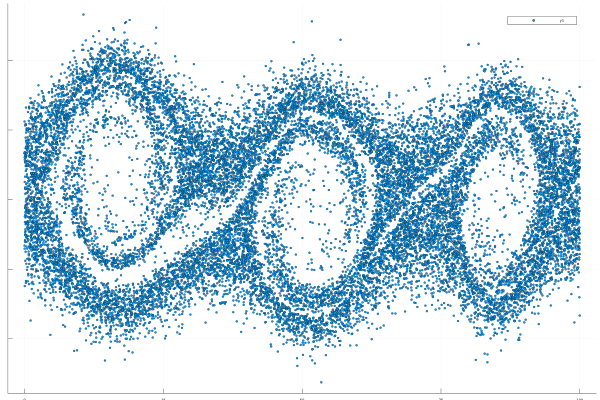

In [46]:
scatter(u[1:N],u[N+1:end], thickness_scaling = 0.3)
#png("t20_1024_2_4")